In this notebook, we'll use a pre-trained machine learning model to generate a submission to the [BirdClef2023 competition](https://www.kaggle.com/c/birdclef-2023).  The goal of the competition is to identify Eastern African bird species by sound.

## Step 1: Imports

In [11]:
# Install All libraries
!pip install -Uq fastcore fastai fastbook
!pip install image_tabular
!pip install kaggle
! [ -e /content ] && pip install -Uqq pip fastai git+https://github.com/drscotthawley/fastproaudio.git

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 25.5 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [2]:
from google.colab import files, drive
drive.mount("/content/gdrive")
# Switch do DeepLearning directory
%cd /content/gdrive/MyDrive/DeepLearning

Mounted at /content/gdrive
/content/gdrive/MyDrive/DeepLearning


In [12]:
import pandas as pd
import numpy as np
import librosa
import librosa.display
import glob

import csv
import io

import os

from IPython.display import Audio

import torchaudio
import torch

# fastproaudio
from fastproaudio.core import *


# Fastai
import fastbook
fastbook.setup_book()
from fastbook import *
from fastcore.transform import Transform
from fastai.torch_core import TensorBase
from fastai.data.core import TensorImageBase

# Import all the vision library
from fastai.vision.all import *


In [4]:
# Setup kaggle API

# 1. Read the kaggle API token to interact with your kaggle account
# Folder containing kaggle.json for kaggle API authorization
os.environ['KAGGLE_CONFIG_DIR'] = "/content/gdrive/MyDrive/DeepLearning/"

In [36]:
!ls
# Pick a path to download the dataset to:
comp = 'birdclef-2023'
path_root = URLs.path(comp)
path = Path(path_root/'train_audio')

kaggle.json  path_spectrogram


In [48]:
#And use the Kaggle API to download the dataset to that path, and extract it:
#hide
Path.BASE_PATH = path

from kaggle import api

if not path_root.exists():
    path_root.mkdir(parents=true)
    api.competition_download_cli(comp, path=path_root)
    shutil.unpack_archive(str(path_root/f'{comp}.zip'), str(path_root))

path_root.ls(file_type='text')

(#0) []

## Example processing of 1 audio file for the whole pipeline

Get audio file

In [41]:
def get_audio_files(path):
    return get_files(path, extensions='.ogg', recurse=True)

items = get_audio_files(path)
fn = items[0]; fn

Path('train_audio/bltapa1/XC237745.ogg')

Preview audio file

In [8]:
audio_abe, sr_abe = torchaudio.load(fn)
Audio(data=audio_abe, rate=sr_abe)

Shape: (1, 1628369), Dtype: torch.float32, Duration: 50.88653125 s
Max:  0.613,  Min: -0.618, Mean: -0.000, Std Dev:  0.067


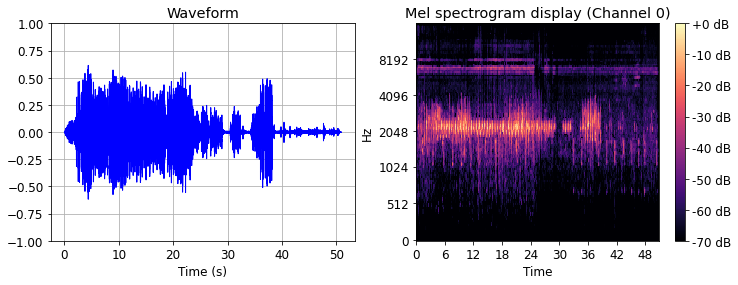

In [13]:
show_audio(audio_abe, sr_abe)


Convert audio file to Tensor

In [14]:
tconv = ToTensor()
wav_array = tconv(audio_abe)
wav_array.shape,type(wav_array)

(torch.Size([1, 1628369]), torch.Tensor)

Extract label of audio file

In [15]:
lbl = parent_label(fn); lbl


'bltapa1'

And then converting the label to an int for modeling:



In [52]:
# Extract labels from submission csv
labels_csv_path = path/"sample_submission.csv"

def class_names_from_csv(class_map_csv_text):
    """Returns list of class names corresponding to score vector."""
    with open(class_map_csv_text) as csv_file:

        csv_reader = csv.reader(csv_file, delimiter=',')
        class_names = csv_reader.__next__()
        # Return all columns headers except for the first one which is "rows"
        return class_names[1:]

# Put all bird ids into labels list
labels_vocab = class_names_from_csv(labels_csv_path)



In [60]:
labels_vocab[1:5]

['abhori1', 'abythr1', 'afbfly1', 'afdfly1']

In [57]:
path/"train_audio"


Path('train_audio')

In [61]:
# Transform labels into integers and get integer label of the audio file
tcat = Categorize(vocab=labels_vocab)
label_int = tcat(lbl); label_int

TensorCategory(39)

We use decode to reverse transforms for display. Reversing the Categorize transform result in a class name we can display:

In [62]:
lbld = tcat.decode(label_int)
lbld

'bltapa1'

##PIPELINE

We can compose our image steps using Pipeline:



In [63]:
# Defining funciton returning only wav array of librosa.load()
def customLoad(audio_file):
  wav_array, sample_rate = torchaudio.load(audio_file)
  return wav_array

pipe = Pipeline([customLoad,tconv])
wav_array = pipe(fn)
wav_array.shape,type(wav_array)

(torch.Size([1, 1628369]), torch.Tensor)

Use Transform to transform training data to spectrograms

In [80]:
def show_spectrogram(o, *, ax=None, figsize=None, title=None, ctx=None, cmap=None, norm=None, aspect=None, interpolation=None, alpha=None, vmin=None, vmax=None, origin=None, extent=None, interpolation_stage=None, filternorm=True, filterrad=4.0, resample=None, url=None, data=None, **kwargs)
    img = Image.fromarray(array(o*255).float())

    
    if ax is None: fig, ax = plt.subplots()
    img = librosa.display.specshow(o, y_axis='mel', x_axis='time', ax=None, sr=rate, vmin=-70, vmax=0)
    ax.set(title='Mel spectrogram display (Channel 0)')
    plt.colorbar(img, ax=ax, format="%+2.f dB")
    if ax is None: plt.show(block=False)

# Before we can create a Transform, we need a type that knows how to show itself
# (if we want to use the show method). Here we define a TitledImage:
class TitledImage(fastuple):
  #  def show(self, ctx=None, **kwargs): show_titled_image(self, ctx=ctx, **kwargs)
    def show(self, ctx=None, **kwargs): show_spectrogram(self, ctx=ctx, **kwargs)


In [112]:
# Function to convert audio files into spectrograms
def audio_to_spectrogram(fn:Path, shape=(400,400), fmin=500, fmax=15000, normalize=True, preemphasis=0.95):
    sig, rate = librosa.load(fn)    
    #mel spec parameters
    SAMPLE_RATE = rate
    N_FFT = shape[0] * 8 # window length
    N_MELS = shape[0]
    HOP_LEN = len(sig) // (shape[1] - 1)
    FMAX = fmax
    FMIN = fmin


    spec = librosa.feature.melspectrogram(y=sig, sr=rate)
    spec_db = librosa.power_to_db(spec, ref=np.max)
    print("ICI")
    print(spec_db)
    spec_img = Image.fromarray(spec_db)
    print(spec_img)
    spec_back = array(spec_img)
    print("hjg")
    print(spec_back)
    # Convert PIL image to PyTorch Tensor
    spec_tensor = tensor(spec_db).float()/255
    return spec_tensor

def plot_melspec(waveform, sample_rate, ax=None, ref=np.max, vmin=-70, vmax=0):
    "Mel-spectrogram plot, from librosa documentation"
    if ax is None: fig, ax = plt.subplots()
    M = librosa.feature.melspectrogram(y=waveform.numpy()[0], sr=sample_rate)
    M_db = librosa.power_to_db(M, ref=ref)
    img = librosa.display.specshow(M_db, y_axis='mel', x_axis='time', ax=ax, sr=sample_rate, vmin=vmin, vmax=vmax)
    ax.set(title='Mel spectrogram display (Channel 0)')
    plt.colorbar(img, ax=ax, format="%+2.f dB")
    if ax is None: plt.show(block=False)

class BirdSongTransform(Transform):
    def __init__(self, vocab, o2i, lblr): self.vocab,self.o2i,self.lblr = vocab,o2i,lblr
    def encodes(self, o): return [audio_to_spectrogram(o), self.o2i[self.lblr(o)]]
    def decodes(self, x): return TitledImage(x[0],self.vocab[x[1]])

To use this Transform, we need a label function. We use the parent folder.
Then we gather all the possible labels, uniqueify them and ask for the two correspondences (vocab and o2i) using bidir=True. We can then use them to build our pet transform.

In [74]:
labeller = parent_label
vals = list(map(labeller, items))
vocab,o2i = uniqueify(vals, sort=True, bidir=True)
birds = BirdSongTransform(vocab,o2i,labeller)

We can check how it’s applied to a filename:



In [111]:
x,y = birds(items[5])
x.shape,y

ICI
[[-80.       -77.07419  -69.761925 ... -80.       -80.       -80.      ]
 [-80.       -78.0275   -64.955414 ... -68.551346 -79.16861  -80.      ]
 [-80.       -80.       -60.667114 ... -62.654163 -76.30648  -80.      ]
 ...
 [-80.       -80.       -80.       ... -78.79982  -80.       -80.      ]
 [-80.       -80.       -80.       ... -80.       -80.       -80.      ]
 [-80.       -80.       -80.       ... -80.       -80.       -80.      ]]
<PIL.Image.Image image mode=F size=553x128>
hjg
[[-80.       -77.07419  -69.761925 ... -80.       -80.       -80.      ]
 [-80.       -78.0275   -64.955414 ... -68.551346 -79.16861  -80.      ]
 [-80.       -80.       -60.667114 ... -62.654163 -76.30648  -80.      ]
 ...
 [-80.       -80.       -80.       ... -78.79982  -80.       -80.      ]
 [-80.       -80.       -80.       ... -80.       -80.       -80.      ]
 [-80.       -80.       -80.       ... -80.       -80.       -80.      ]]


(torch.Size([128, 553]), 39)

In [113]:
x,y = birds(items[5])
x.shape,y

ICI
[[-80.       -77.07419  -69.761925 ... -80.       -80.       -80.      ]
 [-80.       -78.0275   -64.955414 ... -68.551346 -79.16861  -80.      ]
 [-80.       -80.       -60.667114 ... -62.654163 -76.30648  -80.      ]
 ...
 [-80.       -80.       -80.       ... -78.79982  -80.       -80.      ]
 [-80.       -80.       -80.       ... -80.       -80.       -80.      ]
 [-80.       -80.       -80.       ... -80.       -80.       -80.      ]]
<PIL.Image.Image image mode=F size=553x128>
hjg
[[-80.       -77.07419  -69.761925 ... -80.       -80.       -80.      ]
 [-80.       -78.0275   -64.955414 ... -68.551346 -79.16861  -80.      ]
 [-80.       -80.       -60.667114 ... -62.654163 -76.30648  -80.      ]
 ...
 [-80.       -80.       -80.       ... -78.79982  -80.       -80.      ]
 [-80.       -80.       -80.       ... -80.       -80.       -80.      ]
 [-80.       -80.       -80.       ... -80.       -80.       -80.      ]]


(torch.Size([128, 553]), 39)

And we can decode our transformed version and show it:



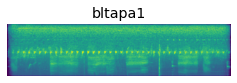

In [88]:
dec = birds.decode([x,y])
dec.show()

In [27]:
from fastai.vision.all import *
from fastai.data.block import *
import librosa
from PIL import Image


def resample_audio(y, orig_sr, target_sr=32000):
    return librosa.resample(y, orig_sr=orig_sr, target_sr=target_sr)

def audio_to_spectrogram(audio, sr):
    audio_chunks = librosa.util.frame(audio, frame_length=5*sr, hop_length=5*sr)
    spectrograms = []
    for chunk in audio_chunks.T:
        #spec = librosa.feature.melspectrogram(y=chunk, sr=sr)
        #spec_db = librosa.power_to_db(spec, ref=np.max)
        #spec_img = Image.fromarray(spec_db)
        #spectrograms.append(spec_img)

        spec = librosa.feature.melspectrogram(y=chunk, sr=sr)
        spec_db = librosa.power_to_db(spec, ref=np.max)
        spec_img = Image.fromarray(spec_db)
        # Convert PIL image to PyTorch Tensor
        spec_tensor = tensor(spec_img).float()/255
        spectrograms.append(spec_tensor)
    return spectrograms

def batch_audio_to_spectrogram(batch):
    resampled = []
    spectrograms = []
    for (file_path, label) in batch:
        y, sr = librosa.load(file_path)
        y_resampled = resample_audio(y, sr)
        resampled.append(y_resampled)
        spec = audio_to_spectrogram(y_resampled, 32000)
        for spec_img in spec:
            spectrogram_tensor = ToTensor()(spec_img)
            spectrograms.append(spectrogram_tensor)
    return (spectrograms,)

def import_audio_to_spectrogram(tuple_file_path_label):
    print(tuple_file_path_label)
    file_path = tuple_file_path_label[0]
    label = tuple_file_path_label[1]
    resampled = []
    y, sr = librosa.load(file_path)
    y_resampled = resample_audio(y, sr)
    resampled.append(y_resampled)
    return (audio_to_spectrogram(y_resampled, 32000), label)


def get_audio_files(path):
    return get_files(path, extensions='.ogg')

dblock = DataBlock(
    blocks=(TransformBlock(type_tfms=import_audio_to_spectrogram), CategoryBlock),
    get_items=lambda path: get_audio_files(path),
    get_y=parent_label,
    splitter=RandomSplitter(),
    batch_tfms=batch_audio_to_spectrogram
)


dls = dblock.dataloaders(path, bs=8)

/root/.fastai/archive/birdclef-2023/train_audio/helgui/XC447371.ogg


TypeError: ignored

## Step 2: Explore the training data

We'll start by loading a couple of training examples and using the IPython.display.Audio module to play them!

In [7]:
# Load a sample audio files from two different species
audio_abe, sr_abe = librosa.load(path/"train_audio/abethr1/XC128013.ogg")
audio_abh, sr_abh = librosa.load(path/"train_audio/abhori1/XC127317.ogg")

In [8]:
# Play the audio
Audio(data=audio_abe, rate=sr_abe)

In [9]:
# Play the audio
Audio(data=audio_abh, rate=sr_abh)



```
# This is formatted as code
```

## Step 3: Prepare the Data for training

We'll convert the audio files to spectrograms and use a vision learner

In [10]:

audio_extension = '.ogg'
img_extension = '.png'
fnames = get_files(path/'train_audio', extensions=audio_extension)
fnames[:5]

(#5) [Path('train_audio/huncis1/XC398570.ogg'),Path('train_audio/huncis1/XC470592.ogg'),Path('train_audio/huncis1/XC444578.ogg'),Path('train_audio/huncis1/XC299758.ogg'),Path('train_audio/huncis1/XC662368.ogg')]

In [11]:
path_spectrogram = path/"spectrogram"
!mkdir path_spectrogram

mkdir: cannot create directory ‘path_spectrogram’: File exists


In [12]:
Path(path/"train_audio/").ls()

(#264) [Path('train_audio/huncis1'),Path('train_audio/comsan'),Path('train_audio/luebus1'),Path('train_audio/spfbar1'),Path('train_audio/palpri1'),Path('train_audio/bswdov1'),Path('train_audio/hamerk1'),Path('train_audio/brtcha1'),Path('train_audio/butapa1'),Path('train_audio/lesmaw1')...]

In [13]:
# Extract labels from submission csv
labels_csv_path = path/"sample_submission.csv"

def class_names_from_csv(class_map_csv_text):
    """Returns list of class names corresponding to score vector."""
    with open(class_map_csv_text) as csv_file:

        csv_reader = csv.reader(csv_file, delimiter=',')
        class_names = csv_reader.__next__()
        # Return all columns headers except for the first one which is "rows"
        return class_names[1:]

# Put all bird ids into labels list
labels = class_names_from_csv(labels_csv_path)

## Step 4: Preprocess the data

The following functions are one way to load the audio provided and break it up into the five-second samples with a sample rate of 32,000 required by the competition.

In [17]:
class AudioToSpectrogramTransform(Transform):
    """Transforms audio tensor to spectrogram image
    """

    def __init__(self, n_fft=2048, n_hop=512, window=torch.hann_window,
                             n_mels=None, f_min=0, f_max=None, sample_rate=44100,
                             decibels=True, ref='max', top_db=80.0, norm_db=True):
        self.n_fft = n_fft
        self.n_hop = n_hop
        self.window = window
        self.n_mels = n_mels
        self.f_min = f_min
        self.f_max = f_max
        self.sample_rate = sample_rate
        self.decibels = decibels
        self.ref = ref
        self.top_db = top_db
        self.norm_db = norm_db

    def encodes(self, audio_file: np.ndarray):

        tfms = [Spectrogram(n_fft=self.n_fft, n_hop=self.n_hop, window=self.window)]
        if self.n_mels is not None:
            tfms.append(FrequencyToMel(n_mels=self.n_mels, n_fft=self.n_fft, sr=self.sample_rate,
                                      f_min=self.f_min, f_max=self.f_max))
        if self.decibels:
            tfms.append(ToDecibels(ref=self.ref, top_db=self.top_db, normalized=self.norm_db))
        
        return tfms(audio_file)


class ResampleAudio(Transform):
    """Transforms audio tensor to spectrogram image
    """

    def __init__(self, sample_rate=44100):
        self.sample_rate = sample_rate

    def ensure_sample_rate(waveform, original_sample_rate,
                          desired_sample_rate=32000):
        """Resample waveform if required."""
        if original_sample_rate != desired_sample_rate:
            waveform = librosa.resample(waveform, orig_sr=original_sample_rate, target_sr=desired_sample_rate)
        return waveform

    def encodes(self, audio_file_path: Path):
        audio, orig_sample_rate = librosa.load(path/"train_audio/afghor1/XC156639.ogg")
        return ensure_sample_rate(audio, orig_sample_rate, self.sample_rate)
         
class FrameAudio(Transform):
    """Transforms audio tensor to spectrogram image
    """

    def __init__(self, window_size_s: float=5.0, hop_size_s: float = 4.5, sample_rate = 32000):
        self.window_size_s = window_size_s
        self.hop_size_s = hop_size_s
        self.sample_rate = sample_rate

    def frame_audio(
      audio_array: np.ndarray,
      window_size_s: float = 5.0,
      hop_size_s: float = 4.5,
      sample_rate = 32000,
      ) -> np.ndarray:
    
        """Helper function for framing audio for inference."""
        if window_size_s is None or window_size_s < 0:
            return audio_array[np.newaxis, :]
        frame_length = int(window_size_s * sample_rate)
        hop_length = int(hop_size_s * sample_rate)
        framed_audio = librosa.util.frame(audio_array, frame_length=frame_length, hop_length=hop_length, axis=0)
        return framed_audio

    def encodes(self, audio_file: np.ndarray):
        return frame_audio(audio, orig_sample_rate, self.sample_rate)
         


audio, sample_rate = librosa.load(path/"train_audio/afghor1/XC156639.ogg")
sample_rate, wav_data = ensure_sample_rate(audio, sample_rate)

framed_audio = frame_audio(wav_data, sample_rate=sample_rate)

Audio(framed_audio, rate=sample_rate)

In [ ]:

# define learner and train model
learn = cnn_learner(dls, resnet18, metrics=accuracy)
learn.fine_tune(10)

In [17]:
train_metadata = pd.read_csv(path/"train_metadata.csv")
train_metadata.head()
competition_classes = sorted(train_metadata.primary_label.unique())

forced_defaults = 0
competition_class_map = []
for c in competition_classes:
    try:
        i = classes.index(c)
        competition_class_map.append(i)
    except:
        competition_class_map.append(0)
        forced_defaults += 1
        
## this is the count of classes not supported by our pretrained model
## you could choose to simply not predict these, set a default as above,
## or create your own model using the pretrained model as a base.
forced_defaults

264

In [20]:
# Functions from fastai_audio notebooks
def get_frequency_transforms(n_fft=2048, n_hop=512, window=torch.hann_window,
                             n_mels=None, f_min=0, f_max=None, sample_rate=44100,
                             decibels=True, ref='max', top_db=80.0, norm_db=True):
    tfms = [Spectrogram(n_fft=n_fft, n_hop=n_hop, window=window)]
    if n_mels is not None:
        tfms.append(FrequencyToMel(n_mels=n_mels, n_fft=n_fft, sr=sample_rate,
                                   f_min=f_min, f_max=f_max))
    if decibels:
        tfms.append(ToDecibels(ref=ref, top_db=top_db, normalized=norm_db))

    # only one list, as its applied to all dataloaders
    return tfms


def get_frequency_batch_transforms(*args, add_channel_dim=True, **kwargs):
    tfms = get_frequency_transforms(*args, **kwargs)

    def _freq_batch_transformer(inputs):
        xs, ys = inputs
        for tfm in tfms:
            xs = tfm(xs)
        if add_channel_dim:
            xs.unsqueeze_(1)
        return xs, ys
    return [_freq_batch_transformer]


class FrequencyToMel:
    def __init__(self, n_mels=40, n_fft=1024, sr=16000,
                 f_min=0.0, f_max=None, device=None):
        mel_fb = librosa.filters.mel(sr=sr, n_fft=n_fft, n_mels=n_mels,
                                fmin=f_min, fmax=f_max).astype(np.float32)
        self.mel_filterbank = to_device(torch.from_numpy(mel_fb), device)

    def __call__(self, spec_f):
        spec_m = self.mel_filterbank @ spec_f
        return spec_m


class ToDecibels:
    def __init__(self,
                 power=2, # magnitude=1, power=2
                 ref=1.0,
                 top_db=None,
                 normalized=True,
                 amin=1e-7):
        self.constant = 10.0 if power == 2 else 20.0
        self.ref = ref
        self.top_db = abs(top_db) if top_db else top_db
        self.normalized = normalized
        self.amin = amin

    def __call__(self, x):
        batch_size = x.shape[0]
        if self.ref == 'max':
            ref_value = x.contiguous().view(batch_size, -1).max(dim=-1)[0]
            ref_value.unsqueeze_(1).unsqueeze_(1)
        else:
            ref_value = tensor(self.ref)
        spec_db = x.clamp_min(self.amin).log10_().mul_(self.constant)
        spec_db.sub_(ref_value.clamp_min_(self.amin).log10_().mul_(10.0))
        if self.top_db is not None:
            max_spec = spec_db.view(batch_size, -1).max(dim=-1)[0]
            max_spec.unsqueeze_(1).unsqueeze_(1)
            spec_db = torch.max(spec_db, max_spec - self.top_db)
            if self.normalized:
                # normalize to [0, 1]
                spec_db.add_(self.top_db).div_(self.top_db)
        return spec_db


# Returns power spectrogram (magnitude squared)
class Spectrogram:
    def __init__(self, n_fft=1024, n_hop=256, window=torch.hann_window,
                 device=None):
        self.n_fft = n_fft
        self.n_hop = n_hop
        self.window = to_device(window(n_fft), device)

    def __call__(self, x):
        X = torch.stft(x,
                       n_fft=self.n_fft,
                       hop_length=self.n_hop,
                       win_length=self.n_fft,
                       window=self.window,
                       onesided=True,
                       center=True,
                       pad_mode='constant',
                       normalized=True)
        # compute power from real and imag parts (magnitude^2)
        X.pow_(2.0)
        power = X[:,:,:,0] + X[:,:,:,1]
        return power

In [21]:
length = 5. # Length of audio file in sec
n_fft = 1024 # output of fft will have shape [513 x n_frames]
n_hop = n_fft*0.75  # 25% overlap between frames
n_mels = 40 # compress 513 dimensions to 40 via mel frequency scale
sample_rate = 32000

tfms = get_frequency_batch_transforms(n_fft=n_fft, n_hop=n_hop,
                                      n_mels=n_mels, sample_rate=sample_rate)

In [30]:
data = DataBlock(blocks = (ImageBlock, CategoryBlock),
                 get_items=get_image_files, 
                 splitter=RandomSplitter(seed=42),
                 get_y=parent_label,
                 batch_tfms=tfms)

dls = data.dataloaders(path/"train_audio")

TypeError: ignored

Below we load one training sample - use the Audio function to listen to the samples inside the notebook!

In [14]:
audio, sample_rate = librosa.load(path/"train_audio/afghor1/XC156639.ogg")
sample_rate, wav_data = ensure_sample_rate(audio, sample_rate)

framed_audio = frame_audio(wav_data, sample_rate=sample_rate)

Audio(framed_audio, rate=sample_rate)

NameError: ignored

In [31]:
??aug_transforms

In [20]:
!ls

kaggle.json  path_spectrogram


## Step 5: Make predictions

Each test sample is cut into 5-second chunks. We use the pretrained model to return probabilities for all 10k birds included in the model, then pull out the classes used in this competition to create a final submission row. Note that we are NOT doing anything special to handle the 3 missing classes; those will need fine-tuning / transfer learning, which will be handled in a separate notebook.

In [ ]:
fixed_tm = frame_audio(wav_data)
logits, embeddings = model.infer_tf(fixed_tm[:1])
probabilities = tf.nn.softmax(logits)
argmax = np.argmax(probabilities)
print(f"The audio is from the class {classes[argmax]} (element:{argmax} in the label.csv file), with probability of {probabilities[0][argmax]}")

In [ ]:
def predict_for_sample(filename, sample_submission, frame_limit_secs=None):
    file_id = filename.split(".ogg")[0].split("/")[-1]
    
    audio, sample_rate = librosa.load(filename)
    sample_rate, wav_data = ensure_sample_rate(audio, sample_rate)
    
    fixed_tm = frame_audio(wav_data)
    
    frame = 5
    all_logits, all_embeddings = model.infer_tf(fixed_tm[:1])
    for window in fixed_tm[1:]:
        if frame_limit_secs and frame > frame_limit_secs:
            continue
        
        logits, embeddings = model.infer_tf(window[np.newaxis, :])
        all_logits = np.concatenate([all_logits, logits], axis=0)
        frame += 5
    
    frame = 5
    all_probabilities = []
    for frame_logits in all_logits:
        probabilities = tf.nn.softmax(frame_logits).numpy()
        
        ## set the appropriate row in the sample submission
        sample_submission.loc[sample_submission.row_id == file_id + "_" + str(frame), competition_classes] = probabilities[competition_class_map]
        frame += 5

## Step 6: Generate a submission

Now we process all of the test samples as discussed above, creating output rows, and saving them in the provided `sample_submission.csv`. Finally, we save these rows to our final output file: `submission.csv`. This is the file that gets submitted and scored when you submit the notebook.

In [ ]:
test_samples = list(glob.glob("/kaggle/input/birdclef-2023/test_soundscapes/*.ogg"))
test_samples

In [ ]:
sample_sub = pd.read_csv("/kaggle/input/birdclef-2023/sample_submission.csv")
sample_sub[competition_classes] = sample_sub[competition_classes].astype(np.float32)
sample_sub.head()

In [ ]:
frame_limit_secs = 15 if sample_sub.shape[0] == 3 else None
for sample_filename in test_samples:
    predict_for_sample(sample_filename, sample_sub, frame_limit_secs=15)

In [ ]:
sample_sub

In [ ]:
sample_sub.to_csv("submission.csv", index=False)